# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [8]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [10]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [14]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [15]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [16]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [17]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.3940427595376974, discriminator loss: 0.41822641372680697


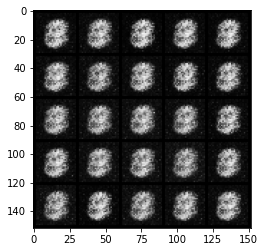

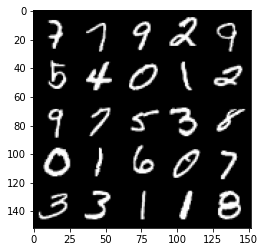

Step 1000: Generator loss: 1.7538182785511012, discriminator loss: 0.279108232170343


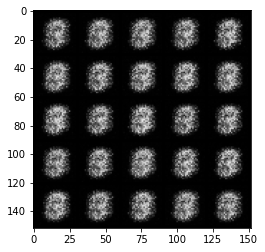

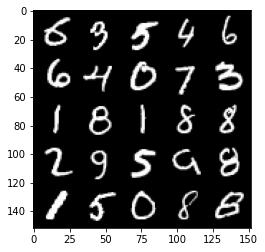

Step 1500: Generator loss: 2.059689065933229, discriminator loss: 0.15879976496100415


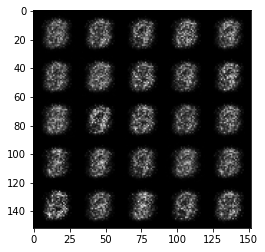

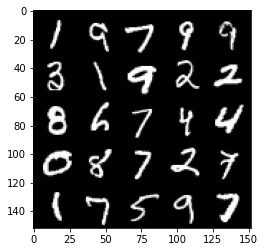

Step 2000: Generator loss: 1.6881799585819226, discriminator loss: 0.22257436370849615


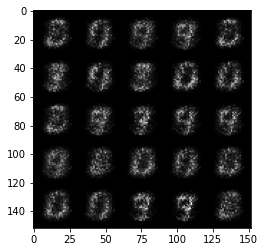

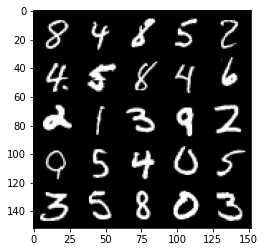

Step 2500: Generator loss: 1.650523064613342, discriminator loss: 0.20946271613240242


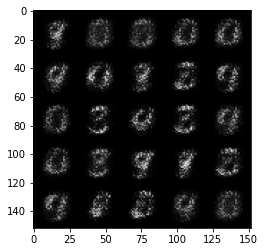

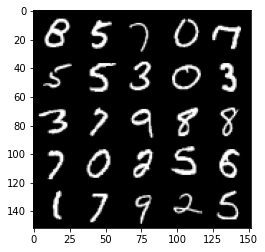

Step 3000: Generator loss: 1.8682489025592803, discriminator loss: 0.18088199809193614


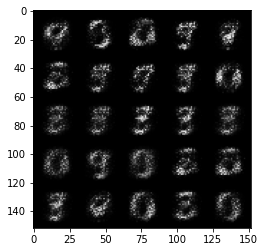

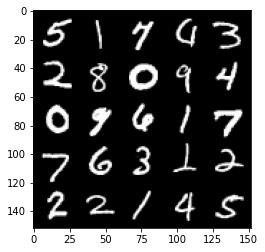

Step 3500: Generator loss: 2.2634247591495495, discriminator loss: 0.14609486734867103


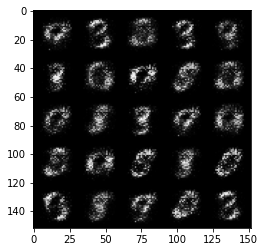

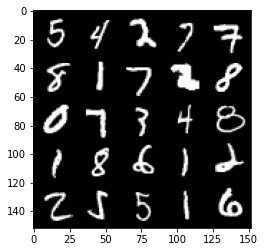

Step 4000: Generator loss: 2.6722197856903063, discriminator loss: 0.11348030753433695


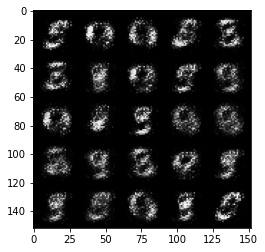

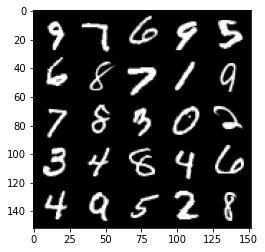

Step 4500: Generator loss: 3.1465295414924626, discriminator loss: 0.08385015010833738


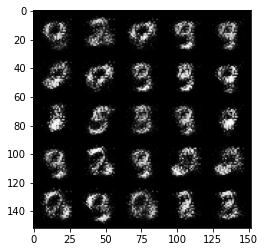

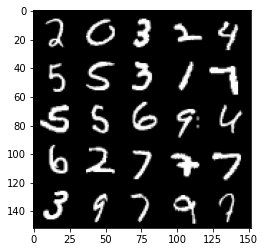

Step 5000: Generator loss: 3.497011401653286, discriminator loss: 0.06830820576101546


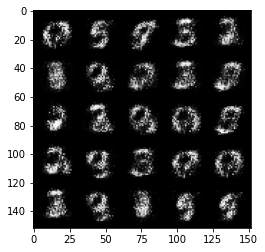

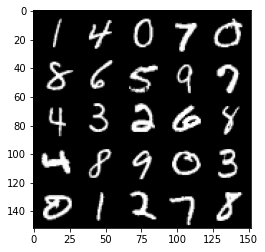

Step 5500: Generator loss: 3.7150982670784005, discriminator loss: 0.06094219172745947


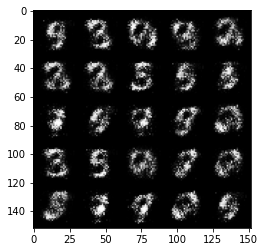

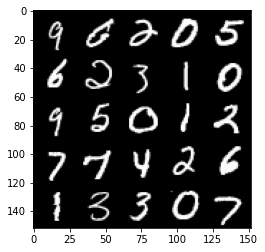

Step 6000: Generator loss: 3.9392939457893315, discriminator loss: 0.05524561489000916


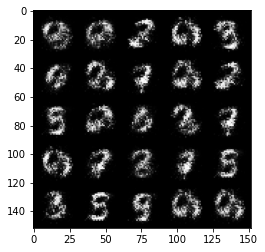

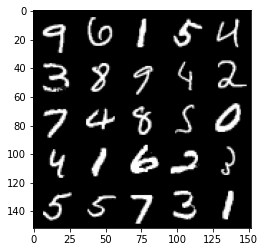

Step 6500: Generator loss: 4.015971889495848, discriminator loss: 0.050399390984326574


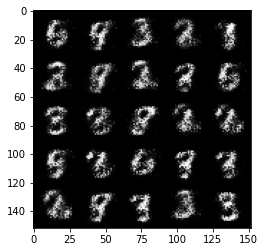

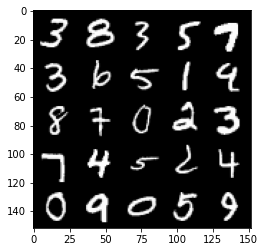

Step 7000: Generator loss: 4.199518186569215, discriminator loss: 0.04826255670934918


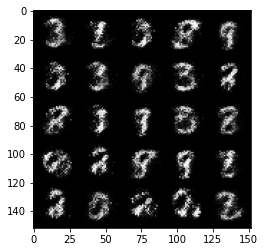

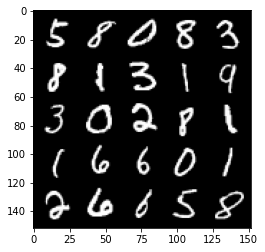

Step 7500: Generator loss: 4.288441819667816, discriminator loss: 0.05395737697556619


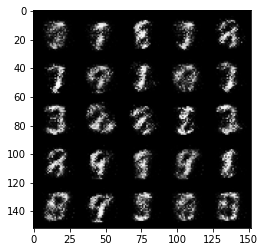

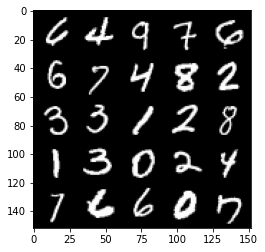

Step 8000: Generator loss: 4.201006809711451, discriminator loss: 0.056256877817213495


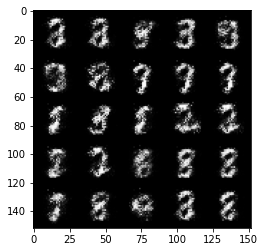

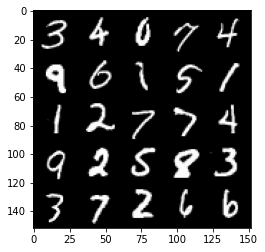

Step 8500: Generator loss: 4.182086408615111, discriminator loss: 0.05653228674083947


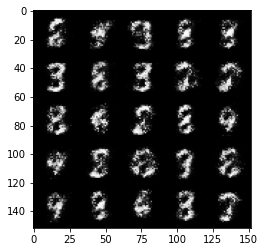

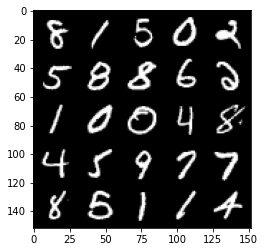

Step 9000: Generator loss: 4.348168232917785, discriminator loss: 0.04834358765184883


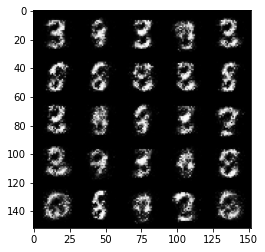

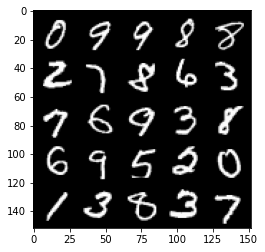

Step 9500: Generator loss: 4.418101349353786, discriminator loss: 0.04273336442559954


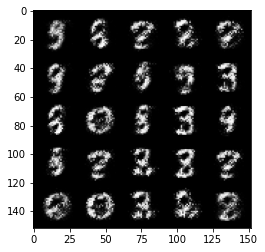

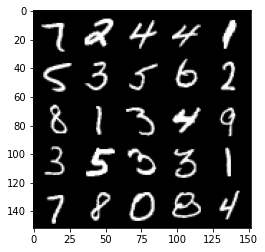

Step 10000: Generator loss: 4.4101822810173, discriminator loss: 0.049248243644833614


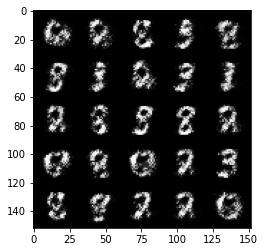

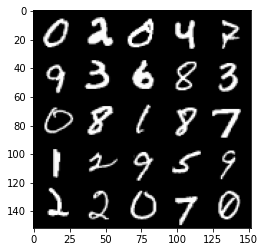

Step 10500: Generator loss: 4.194794957637788, discriminator loss: 0.05785185207426548


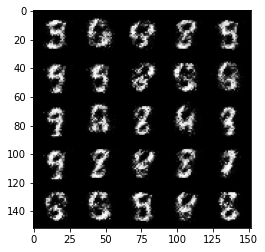

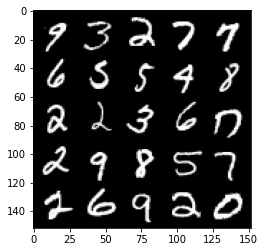

Step 11000: Generator loss: 4.2790719614028925, discriminator loss: 0.06757495719194415


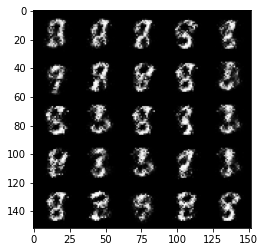

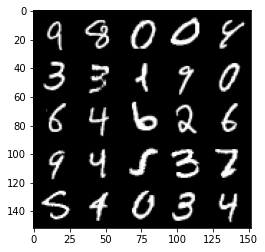

Step 11500: Generator loss: 4.3339433932304425, discriminator loss: 0.06475121891871091


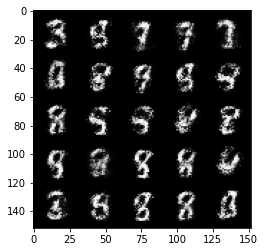

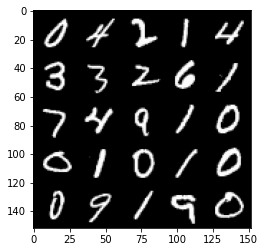

Step 12000: Generator loss: 4.235154695034026, discriminator loss: 0.0673535062335432


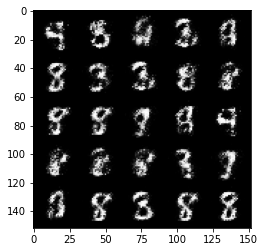

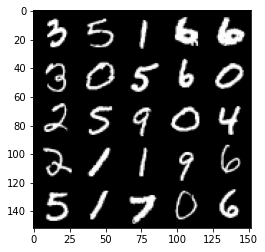

Step 12500: Generator loss: 4.045601869583131, discriminator loss: 0.08331921809166666


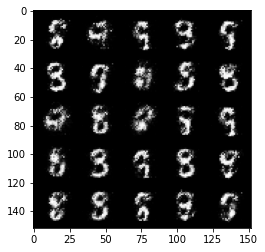

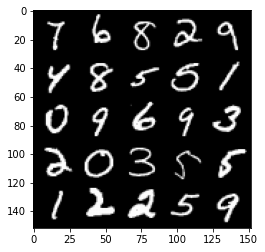

Step 13000: Generator loss: 4.078468703746796, discriminator loss: 0.0913125894069672


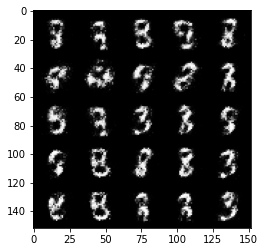

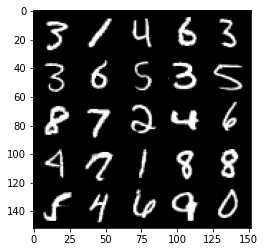

Step 13500: Generator loss: 3.964385508537296, discriminator loss: 0.09947931299358606


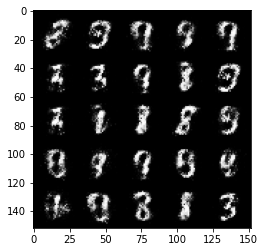

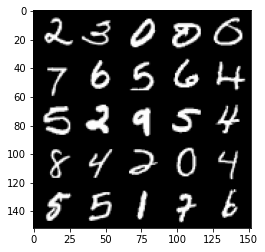

Step 14000: Generator loss: 3.720732529640197, discriminator loss: 0.10440736258029937


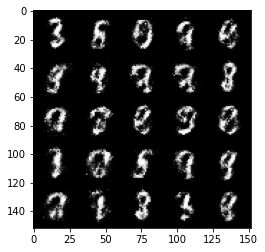

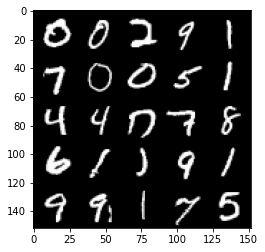

Step 14500: Generator loss: 3.7956699862480163, discriminator loss: 0.10753728714585305


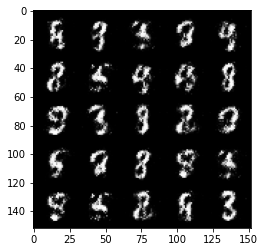

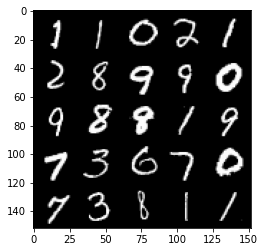

Step 15000: Generator loss: 3.858515507221224, discriminator loss: 0.10258132139593366


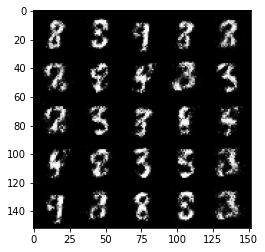

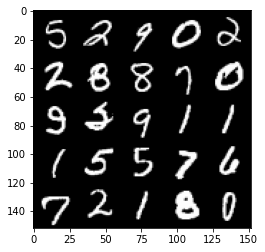

Step 15500: Generator loss: 3.6751612639427194, discriminator loss: 0.11481032856553794


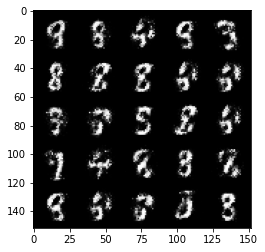

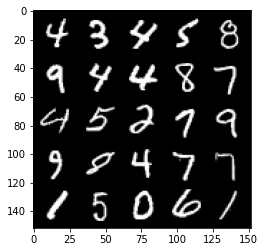

Step 16000: Generator loss: 3.6593747639656096, discriminator loss: 0.1297795026227833


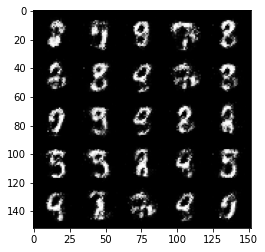

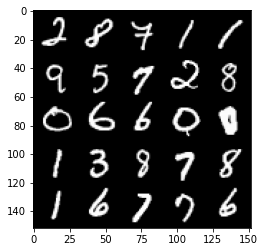

Step 16500: Generator loss: 3.61613926792145, discriminator loss: 0.12110192543268207


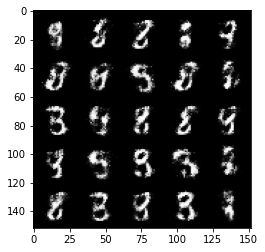

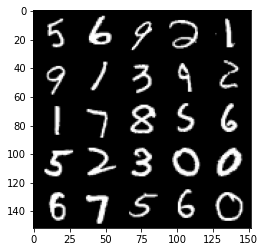

Step 17000: Generator loss: 3.5923777985572807, discriminator loss: 0.1295052491873502


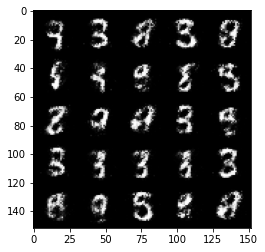

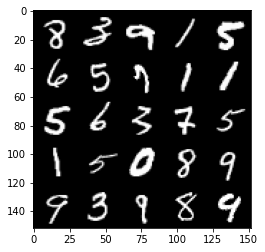

Step 17500: Generator loss: 3.593200409412385, discriminator loss: 0.1222697423249483


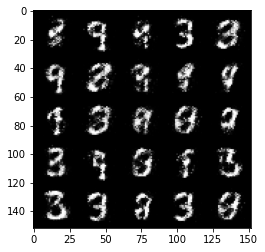

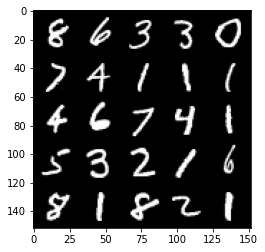

Step 18000: Generator loss: 3.5612879905700674, discriminator loss: 0.12530801223218455


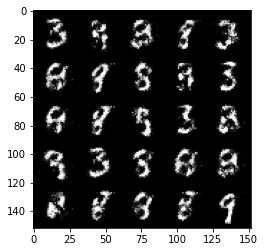

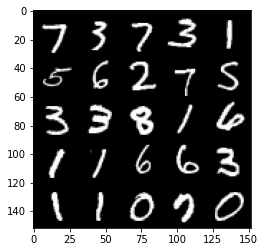

Step 18500: Generator loss: 3.599217523097993, discriminator loss: 0.11360702784359454


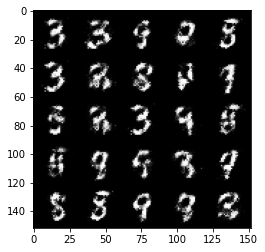

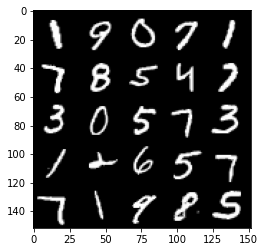

Step 19000: Generator loss: 3.520121059894561, discriminator loss: 0.12849961627274745


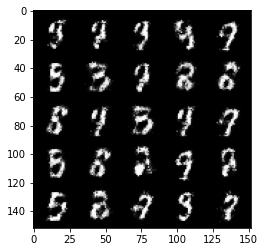

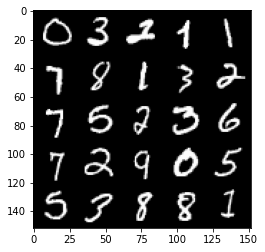

Step 19500: Generator loss: 3.478685838222503, discriminator loss: 0.12702525359392158


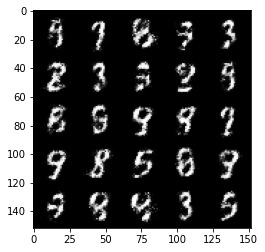

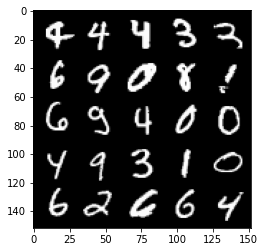

Step 20000: Generator loss: 3.461176732540132, discriminator loss: 0.14105998410284523


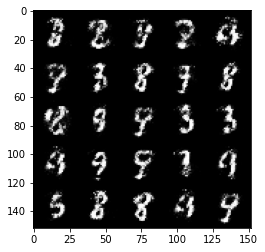

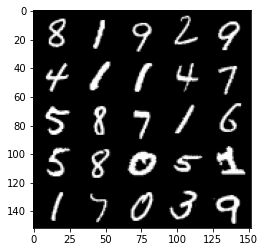

Step 20500: Generator loss: 3.2591858611106868, discriminator loss: 0.14798929466307165


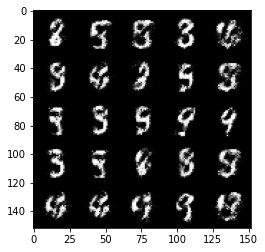

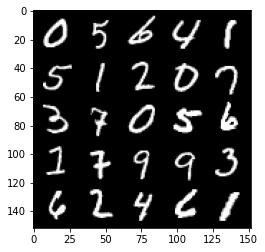

Step 21000: Generator loss: 3.255023260593413, discriminator loss: 0.15272887744009495


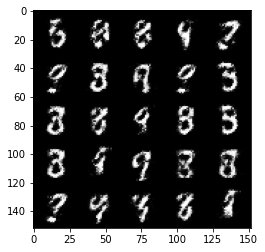

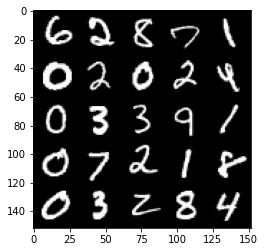

Step 21500: Generator loss: 3.1369308919906644, discriminator loss: 0.16450064645707607


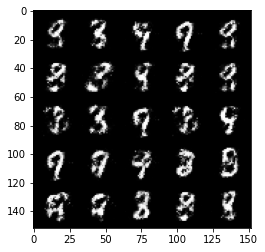

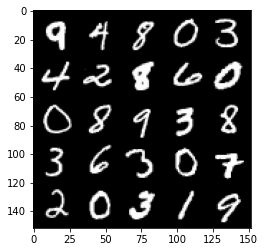

Step 22000: Generator loss: 3.0840359888076803, discriminator loss: 0.16928450582921503


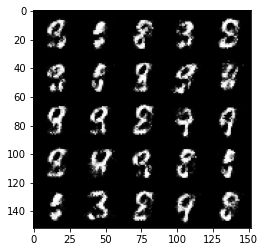

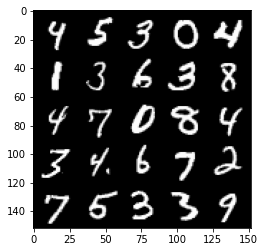

Step 22500: Generator loss: 3.131292081356047, discriminator loss: 0.15861252328753472


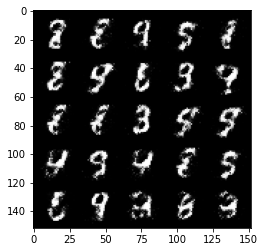

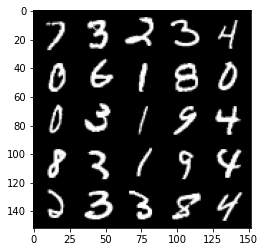

Step 23000: Generator loss: 3.1425178627967836, discriminator loss: 0.16820205835998048


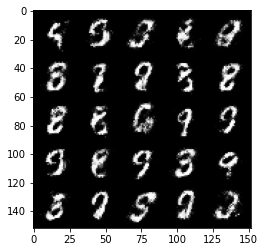

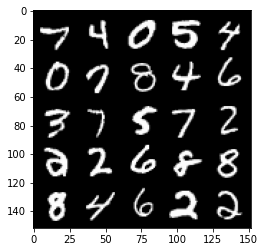

Step 23500: Generator loss: 2.774754770278931, discriminator loss: 0.20644113421440136


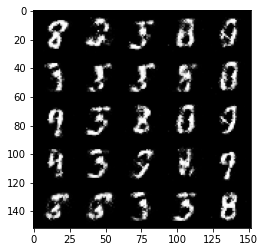

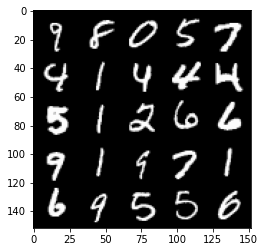

Step 24000: Generator loss: 2.8306131010055555, discriminator loss: 0.19200280469656025


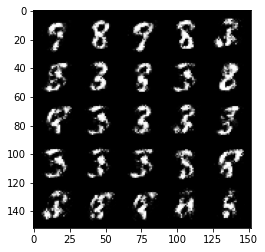

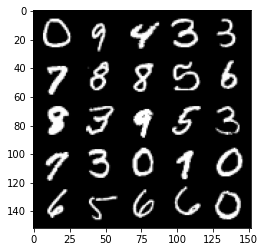

Step 24500: Generator loss: 2.894644402027131, discriminator loss: 0.1893143855035307


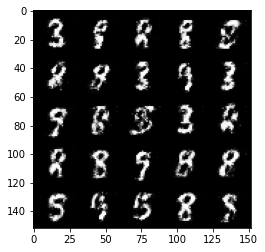

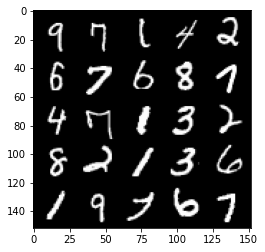

Step 25000: Generator loss: 2.8757399840354907, discriminator loss: 0.18563967847824084


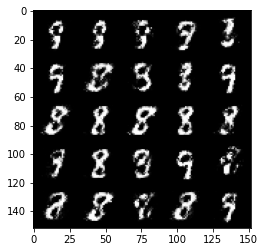

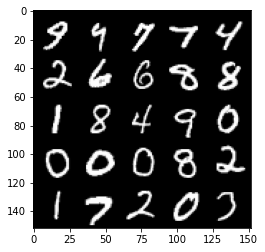

Step 25500: Generator loss: 2.84568457365036, discriminator loss: 0.19990424054861058


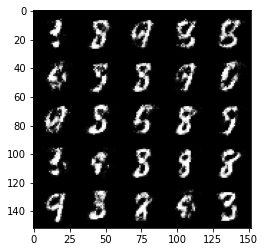

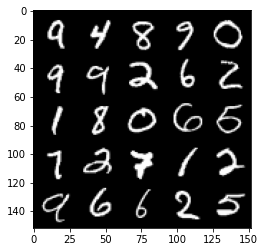

Step 26000: Generator loss: 2.7855365052223258, discriminator loss: 0.20084858733415611


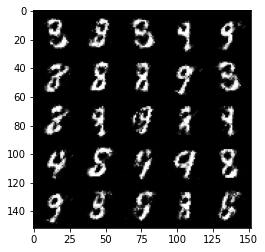

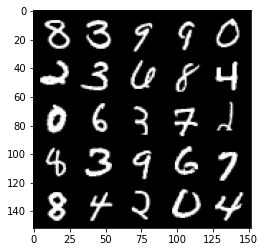

Step 26500: Generator loss: 2.7299557967185963, discriminator loss: 0.19756983001530176


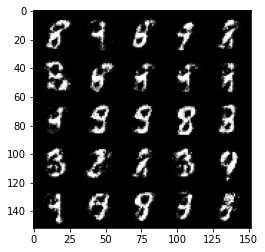

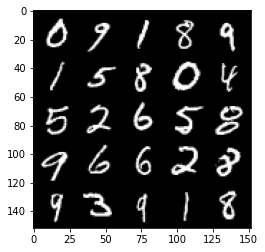

Step 27000: Generator loss: 2.6770291285514847, discriminator loss: 0.20820152583718293


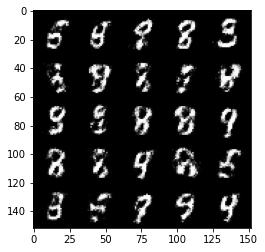

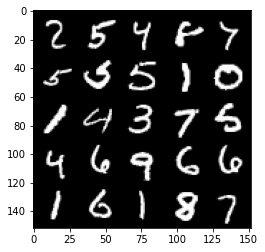

Step 27500: Generator loss: 2.7046984701156633, discriminator loss: 0.2148249166458847


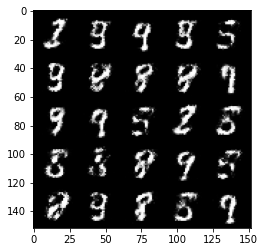

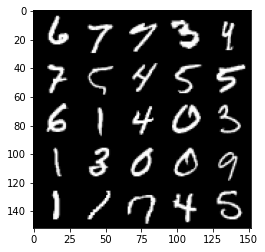

Step 28000: Generator loss: 2.58615461063385, discriminator loss: 0.22319282539188864


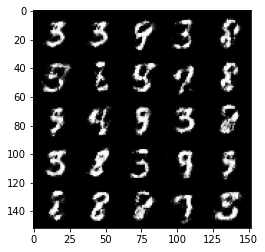

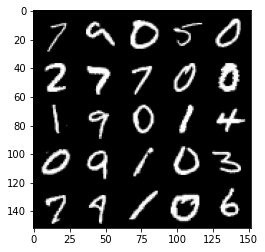

Step 28500: Generator loss: 2.4663589084148407, discriminator loss: 0.24797266477346422


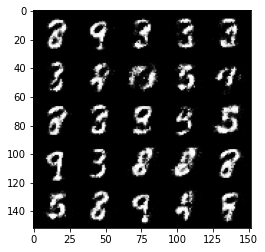

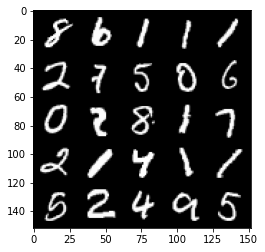

Step 29000: Generator loss: 2.5356794257164, discriminator loss: 0.23581203559040984


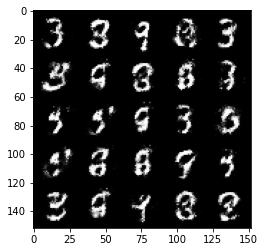

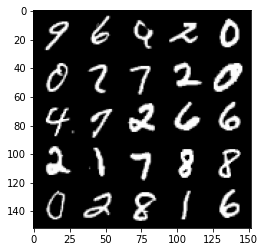

Step 29500: Generator loss: 2.5782815394401553, discriminator loss: 0.21878344243764897


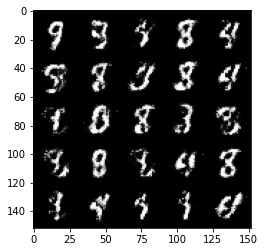

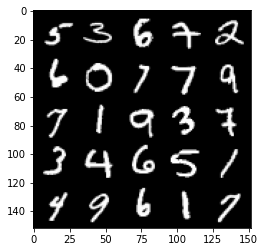

Step 30000: Generator loss: 2.6078091750144936, discriminator loss: 0.21195782259106635


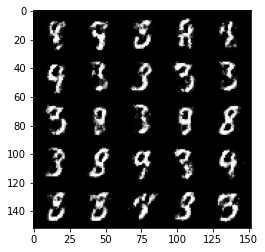

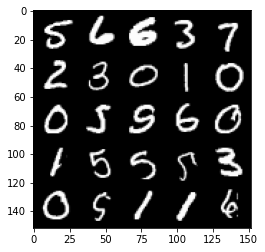

Step 30500: Generator loss: 2.6627321076393113, discriminator loss: 0.20272910398244848


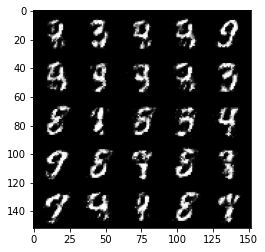

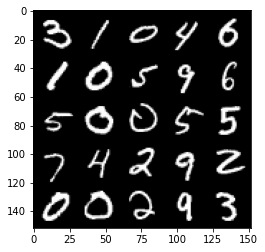

Step 31000: Generator loss: 2.570552064895629, discriminator loss: 0.22758152759075176


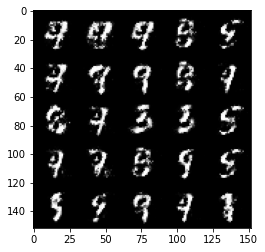

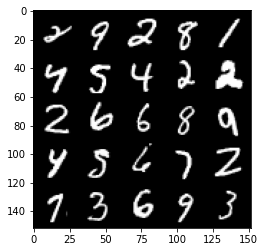

Step 31500: Generator loss: 2.5062121200561505, discriminator loss: 0.24191575011610963


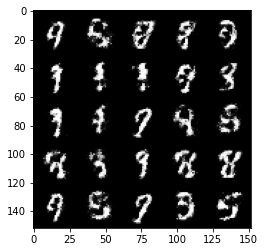

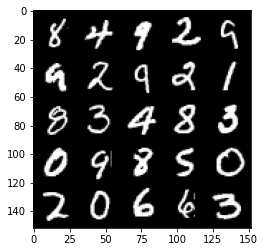

Step 32000: Generator loss: 2.4416745476722728, discriminator loss: 0.24049300608038918


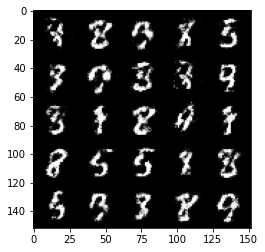

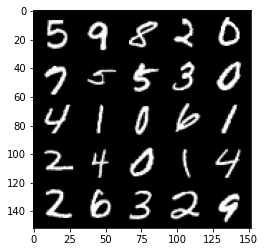

Step 32500: Generator loss: 2.388204167604444, discriminator loss: 0.25321526393294336


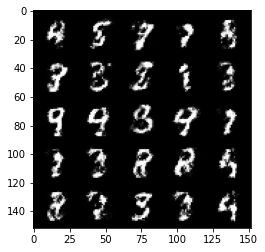

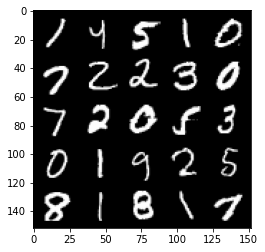

Step 33000: Generator loss: 2.4082648801803597, discriminator loss: 0.22564017382264134


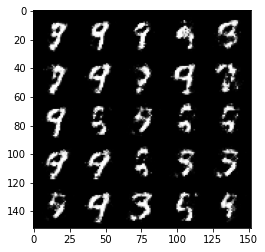

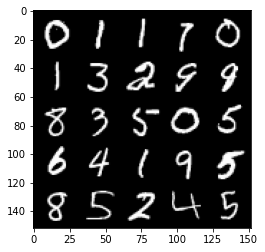

Step 33500: Generator loss: 2.494415301799773, discriminator loss: 0.2300671803951267


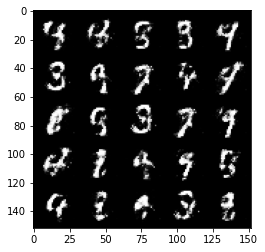

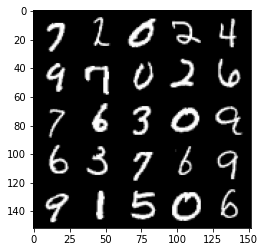

Step 34000: Generator loss: 2.5298412456512436, discriminator loss: 0.21895106178522122


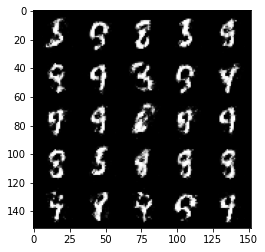

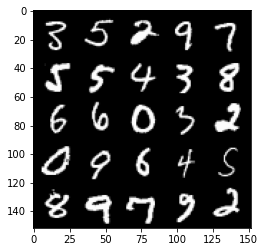

Step 34500: Generator loss: 2.5392186694145176, discriminator loss: 0.2327071743905543


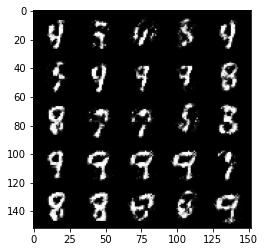

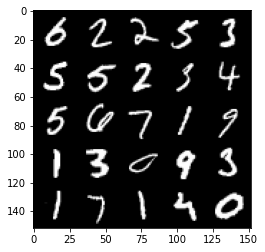

Step 35000: Generator loss: 2.4690858964920044, discriminator loss: 0.22511471226811422


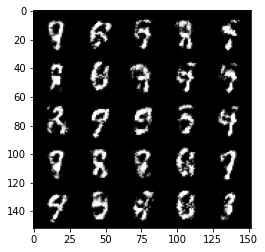

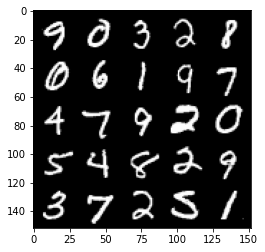

Step 35500: Generator loss: 2.450768903017044, discriminator loss: 0.23976196146011375


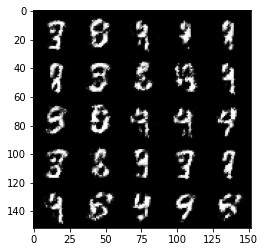

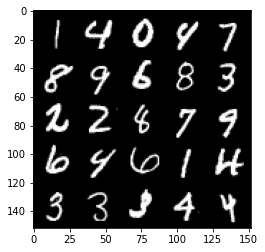

Step 36000: Generator loss: 2.4672803297042813, discriminator loss: 0.23226539865136128


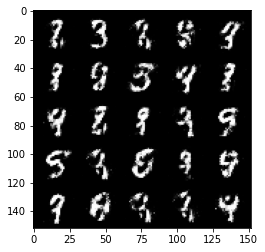

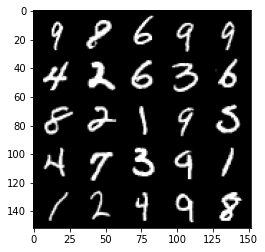

Step 36500: Generator loss: 2.5369311633110048, discriminator loss: 0.2227603365182876


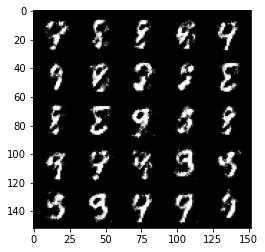

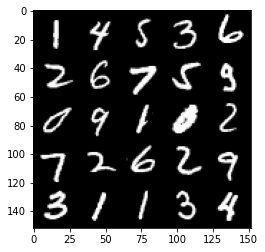

Step 37000: Generator loss: 2.3698020911216737, discriminator loss: 0.2551137215197087


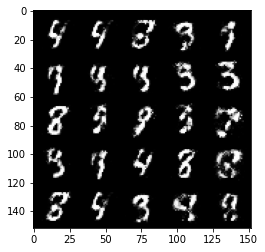

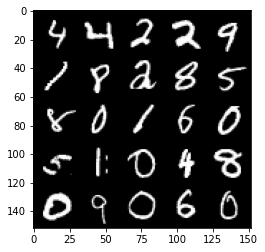

Step 37500: Generator loss: 2.306938932657239, discriminator loss: 0.26014480936527257


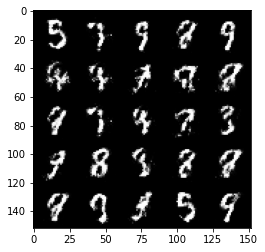

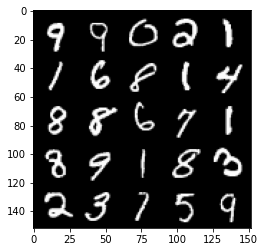

Step 38000: Generator loss: 2.359673864841463, discriminator loss: 0.24116892376542087


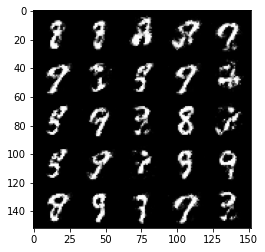

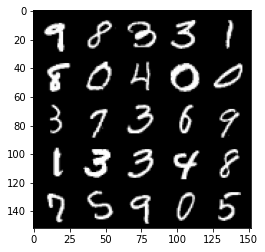

Step 38500: Generator loss: 2.2715881357192993, discriminator loss: 0.26757352590560884


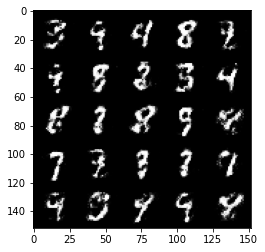

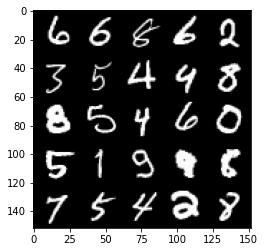

Step 39000: Generator loss: 2.1553896560668946, discriminator loss: 0.2845388405621051


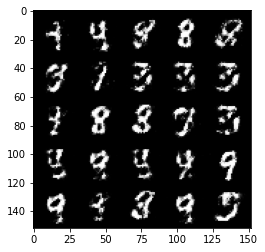

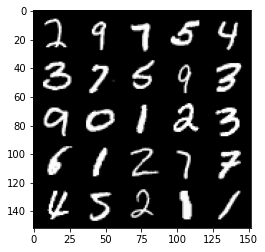

Step 39500: Generator loss: 2.1108182108402267, discriminator loss: 0.2882114443182941


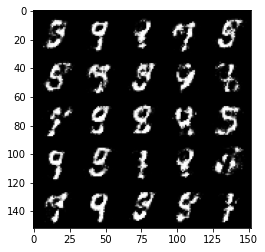

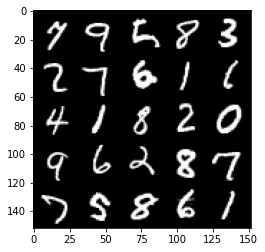

Step 40000: Generator loss: 2.2385743985176054, discriminator loss: 0.26337396097183235


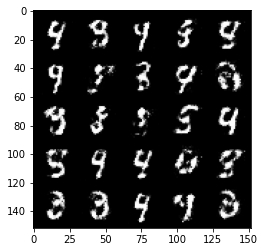

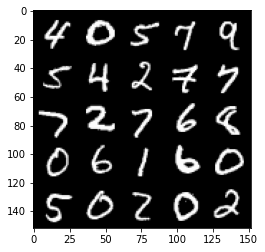

Step 40500: Generator loss: 2.141754953861237, discriminator loss: 0.2903527543246747


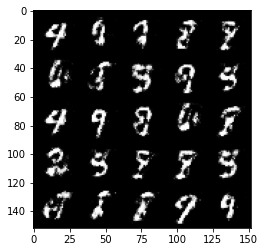

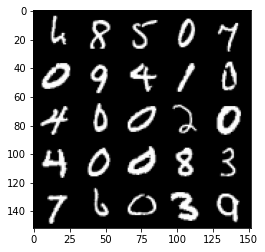

Step 41000: Generator loss: 2.1703829267025, discriminator loss: 0.2835033783316608


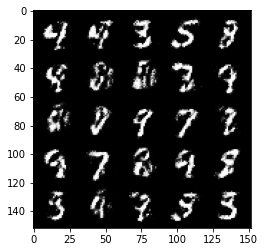

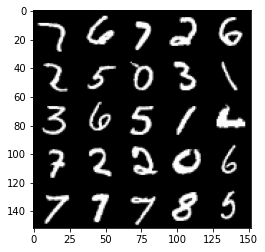

Step 41500: Generator loss: 2.1382934839725474, discriminator loss: 0.28930200183391575


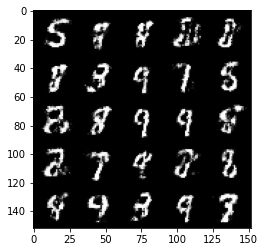

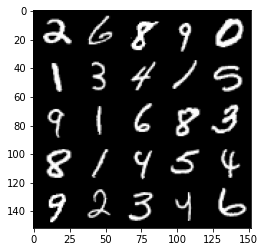

Step 42000: Generator loss: 2.1909060144424424, discriminator loss: 0.2654320006966591


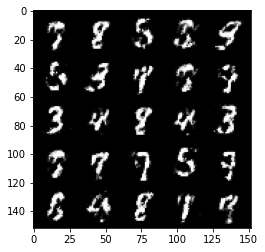

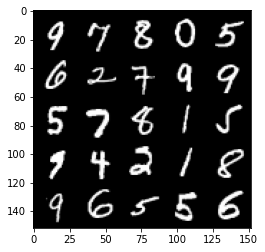

Step 42500: Generator loss: 2.151873033046722, discriminator loss: 0.28288145202398324


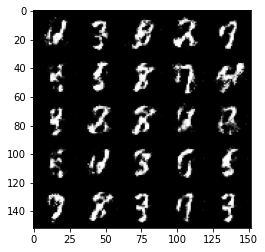

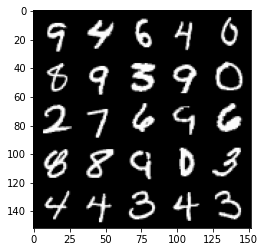

Step 43000: Generator loss: 2.16455582165718, discriminator loss: 0.2818935880661008


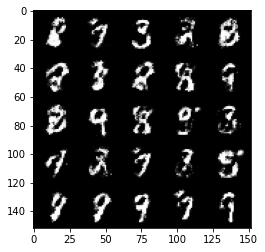

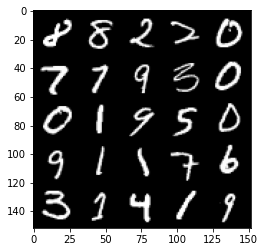

Step 43500: Generator loss: 2.023751766681669, discriminator loss: 0.3002066734731195


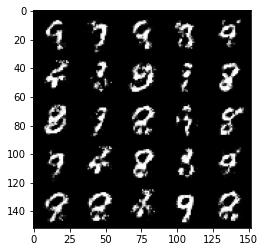

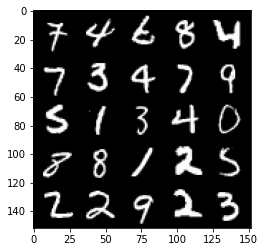

Step 44000: Generator loss: 2.0842293236255642, discriminator loss: 0.28797053784131993


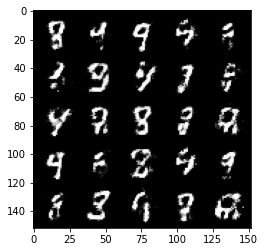

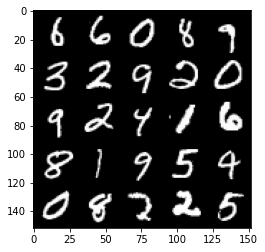

Step 44500: Generator loss: 2.061867855548862, discriminator loss: 0.2986862435638905


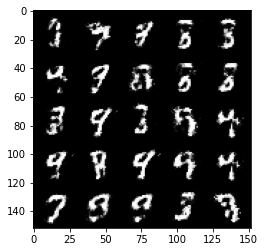

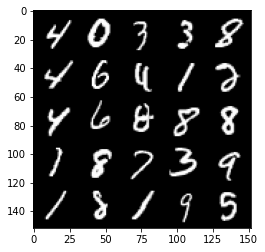

Step 45000: Generator loss: 2.0528478190898887, discriminator loss: 0.2961507911384105


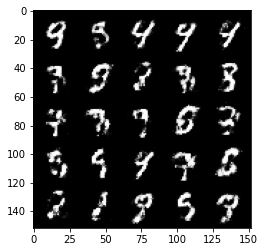

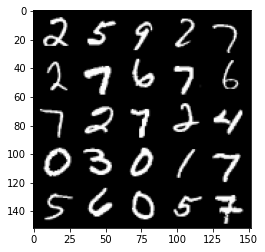

Step 45500: Generator loss: 1.9847481355667118, discriminator loss: 0.3166772502660753


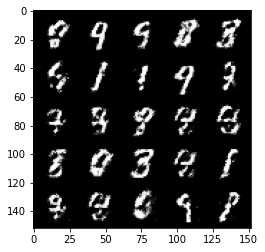

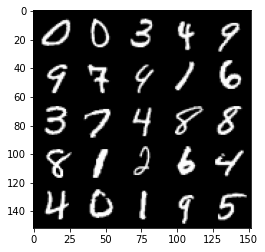

Step 46000: Generator loss: 1.986813142299653, discriminator loss: 0.3046279201805594


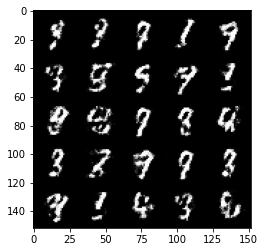

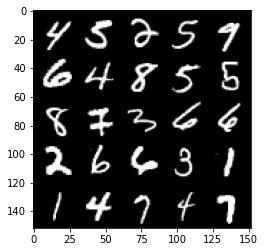

Step 46500: Generator loss: 1.9532698259353656, discriminator loss: 0.31618539670109747


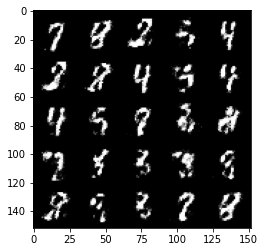

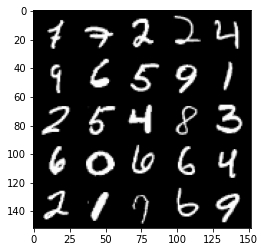

Step 47000: Generator loss: 1.9530719153881073, discriminator loss: 0.3288002206981183


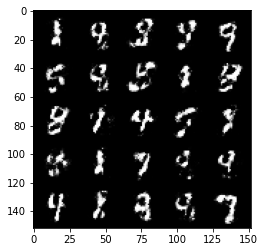

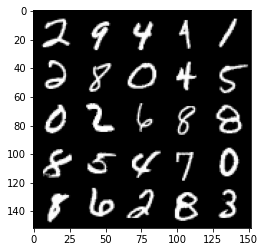

Step 47500: Generator loss: 1.9073225262165079, discriminator loss: 0.33673968800902326


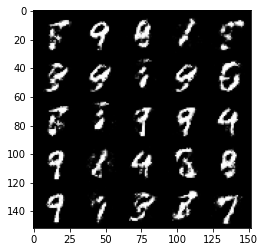

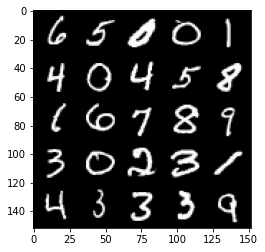

Step 48000: Generator loss: 1.8936664874553675, discriminator loss: 0.33345724281668637


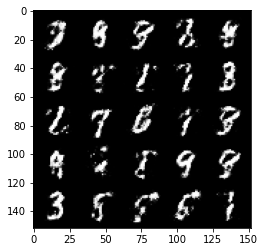

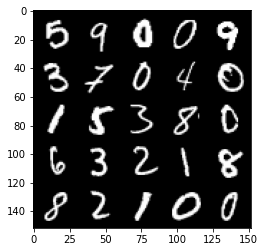

Step 48500: Generator loss: 1.78818862938881, discriminator loss: 0.3538742044568064


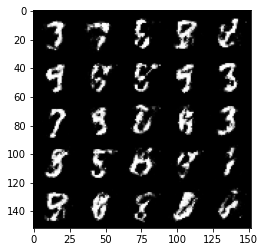

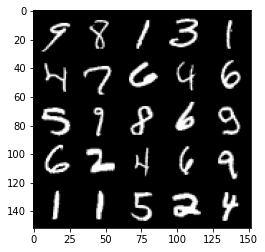

Step 49000: Generator loss: 1.7993814125061045, discriminator loss: 0.35325522971153245


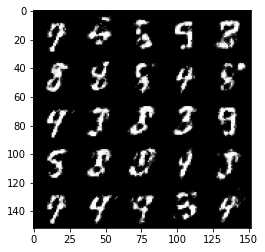

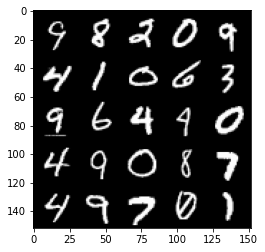

Step 49500: Generator loss: 1.7563334805965434, discriminator loss: 0.3625134357810017


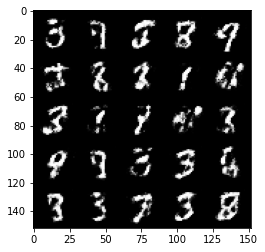

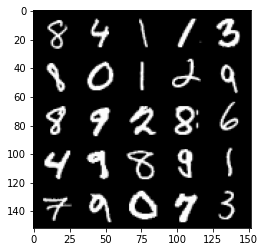

Step 50000: Generator loss: 1.792011662244797, discriminator loss: 0.3481422021985051


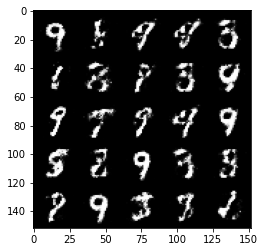

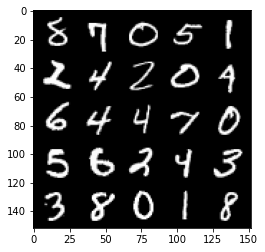

Step 50500: Generator loss: 1.835352848291399, discriminator loss: 0.33277844709157955


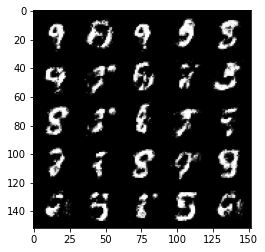

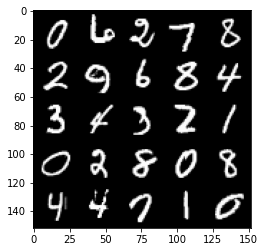

Step 51000: Generator loss: 1.8921994631290433, discriminator loss: 0.3269490672945975


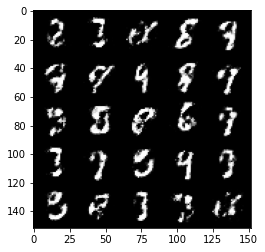

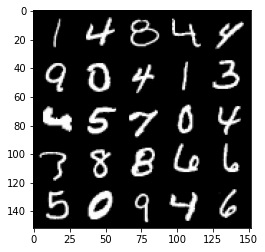

Step 51500: Generator loss: 1.752373785734177, discriminator loss: 0.36528449445962907


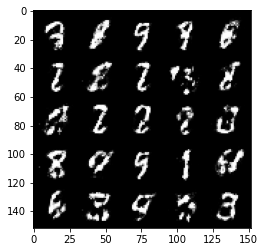

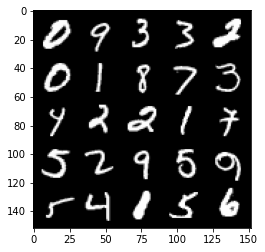

Step 52000: Generator loss: 1.7851981499195086, discriminator loss: 0.3542238985300067


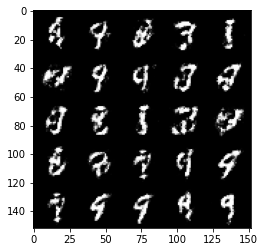

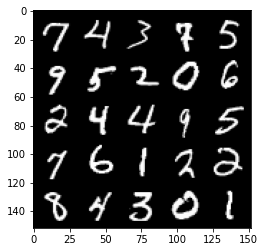

Step 52500: Generator loss: 1.6960116279125224, discriminator loss: 0.3844552727341656


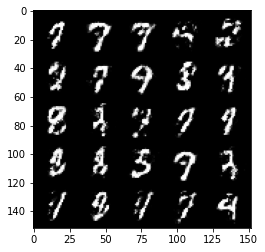

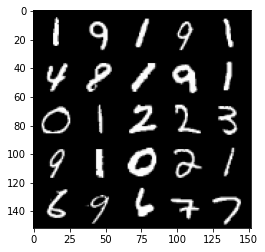

Step 53000: Generator loss: 1.7506604115962972, discriminator loss: 0.3554143102467057


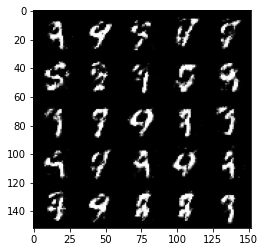

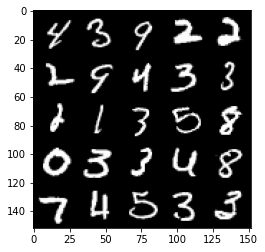

Step 53500: Generator loss: 1.758896824121474, discriminator loss: 0.35581334000825887


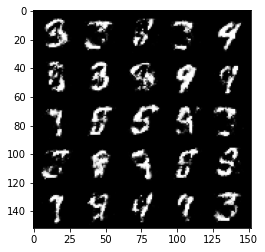

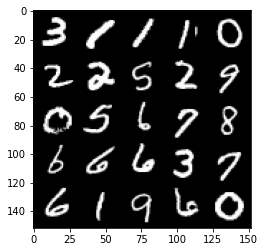

Step 54000: Generator loss: 1.7510163464546196, discriminator loss: 0.3672607666254045


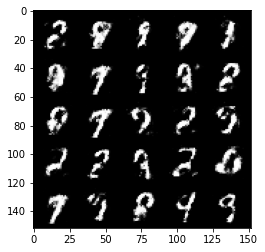

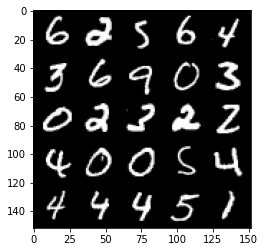

Step 54500: Generator loss: 1.6677062032222738, discriminator loss: 0.359104104667902


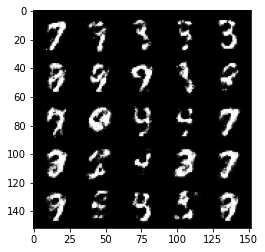

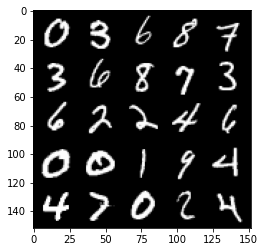

Step 55000: Generator loss: 1.7942834012508413, discriminator loss: 0.33975772625207923


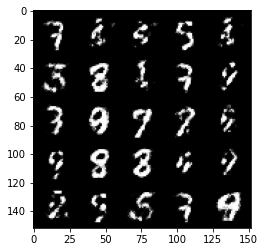

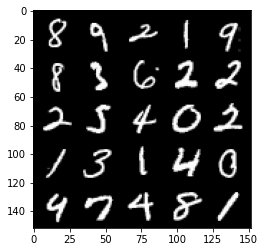

Step 55500: Generator loss: 1.7990727608203876, discriminator loss: 0.33737589055299744


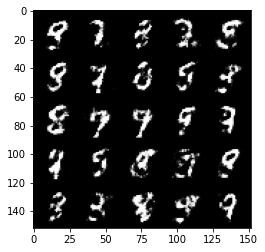

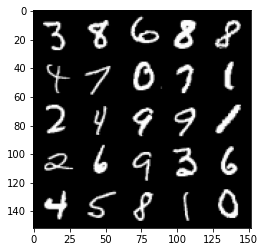

Step 56000: Generator loss: 1.7888697245121006, discriminator loss: 0.35357480537891395


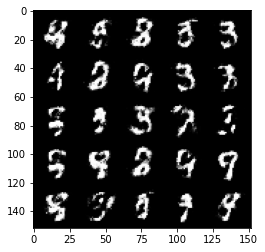

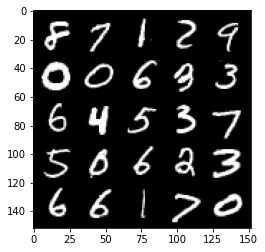

Step 56500: Generator loss: 1.765712745428085, discriminator loss: 0.35144716328382486


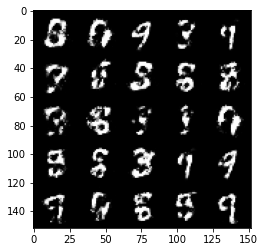

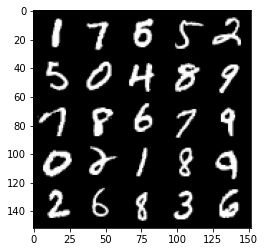

Step 57000: Generator loss: 1.7407977540493016, discriminator loss: 0.3516657259464265


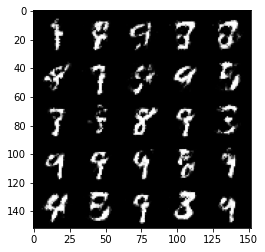

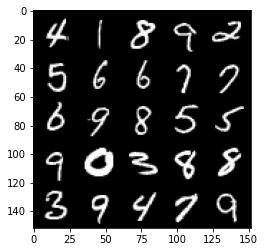

Step 57500: Generator loss: 1.6836586318016065, discriminator loss: 0.37129444134235357


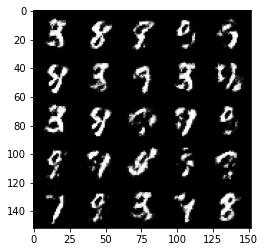

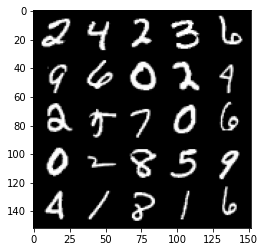

Step 58000: Generator loss: 1.7253946871757506, discriminator loss: 0.35673485505580893


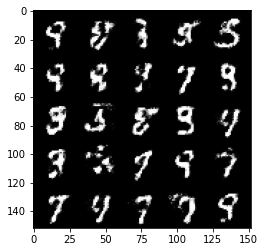

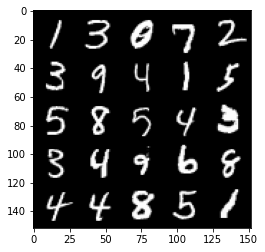

Step 58500: Generator loss: 1.7492323803901666, discriminator loss: 0.36042496740818036


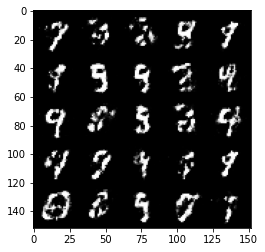

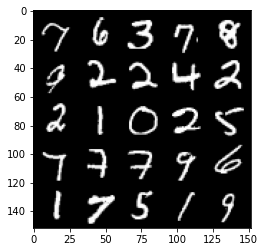

Step 59000: Generator loss: 1.7325664775371554, discriminator loss: 0.35897655111551297


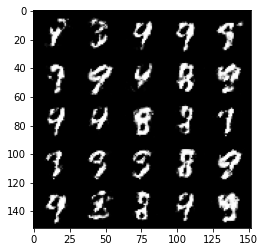

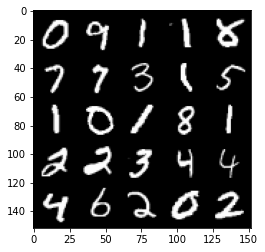

Step 59500: Generator loss: 1.702376605272294, discriminator loss: 0.3565771592259402


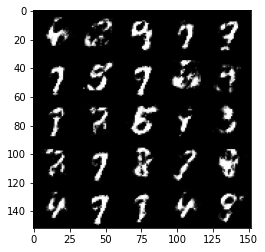

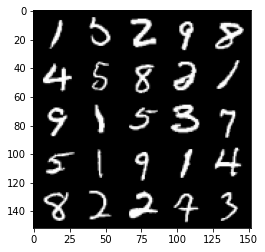

Step 60000: Generator loss: 1.7365875387191765, discriminator loss: 0.35689741879701636


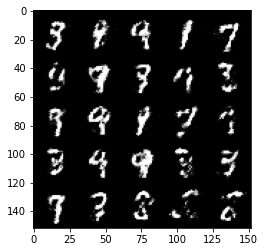

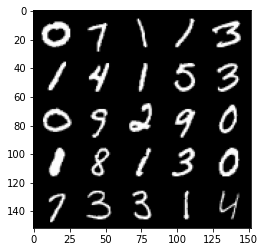

Step 60500: Generator loss: 1.6528986325263981, discriminator loss: 0.37329992264509226


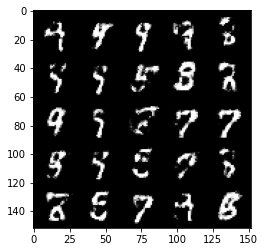

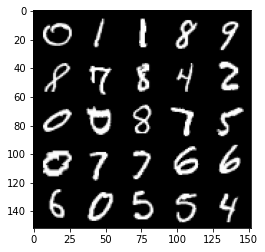

Step 61000: Generator loss: 1.6612704532146465, discriminator loss: 0.3764811822772026


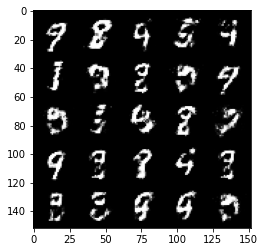

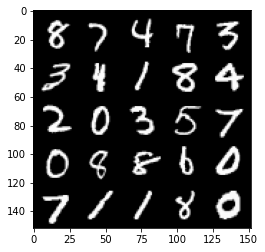

Step 61500: Generator loss: 1.6290902204513544, discriminator loss: 0.3899891036748886


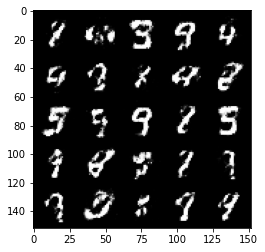

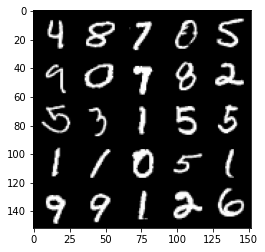

Step 62000: Generator loss: 1.680568781375885, discriminator loss: 0.36530287927389143


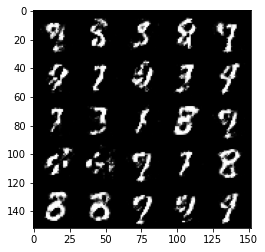

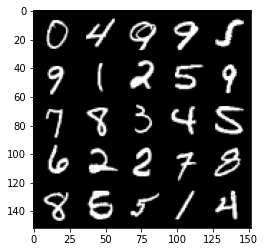

Step 62500: Generator loss: 1.6466226558685304, discriminator loss: 0.38216928929090477


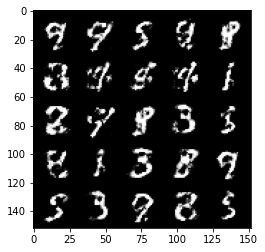

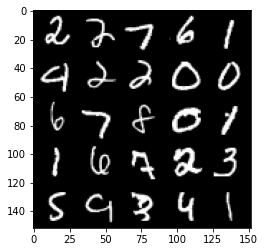

Step 63000: Generator loss: 1.6183857498168939, discriminator loss: 0.3933119056224828


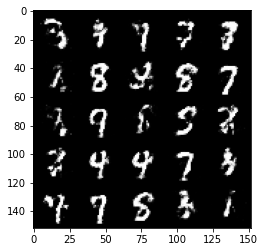

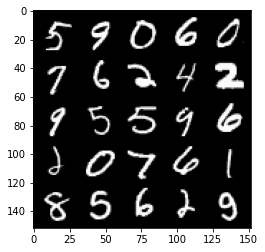

Step 63500: Generator loss: 1.6543327684402458, discriminator loss: 0.3670448554754257


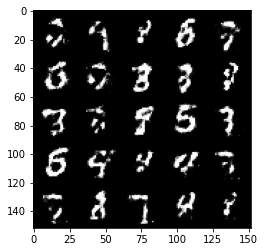

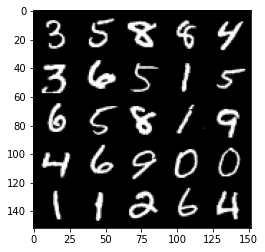

Step 64000: Generator loss: 1.6770672667026505, discriminator loss: 0.3615207493901253


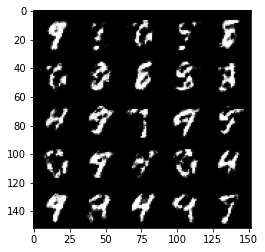

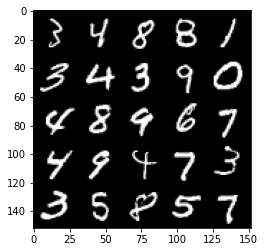

Step 64500: Generator loss: 1.647355149745941, discriminator loss: 0.3627097114324573


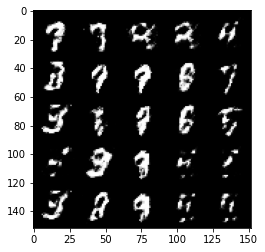

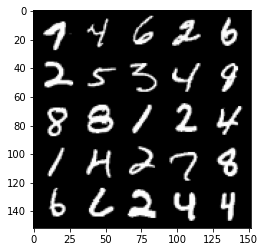

Step 65000: Generator loss: 1.6070267004966734, discriminator loss: 0.3836065840125083


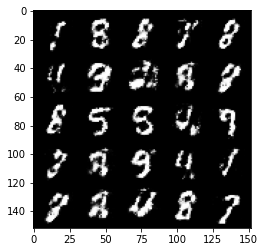

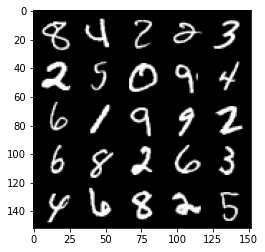

Step 65500: Generator loss: 1.5817459614276899, discriminator loss: 0.3866576762199398


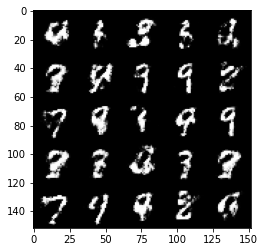

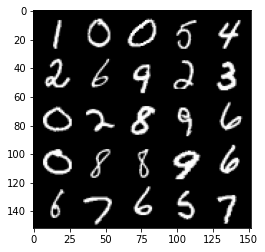

Step 66000: Generator loss: 1.7249923024177547, discriminator loss: 0.3559436964988709


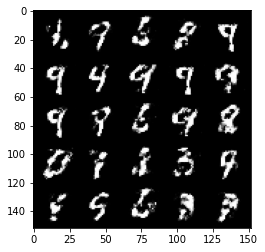

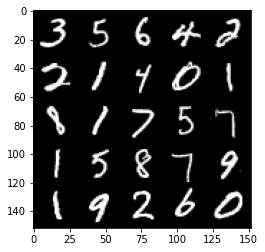

Step 66500: Generator loss: 1.71177920150757, discriminator loss: 0.3552384225130083


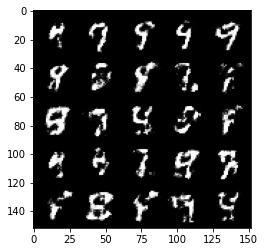

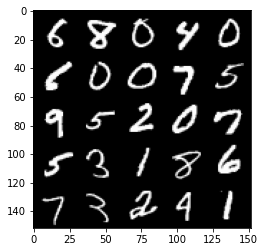

Step 67000: Generator loss: 1.7254623436927787, discriminator loss: 0.35822704648971593


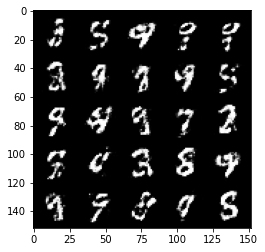

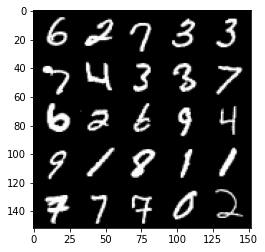

Step 67500: Generator loss: 1.6354590241909017, discriminator loss: 0.36775476151704783


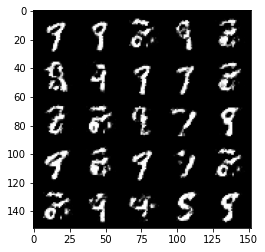

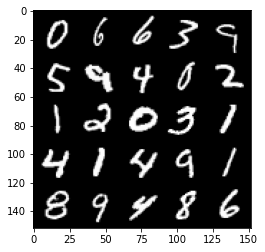

Step 68000: Generator loss: 1.6942754876613628, discriminator loss: 0.3678789810538294


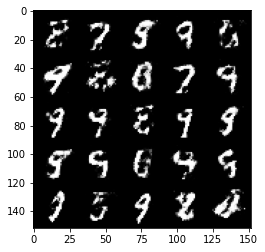

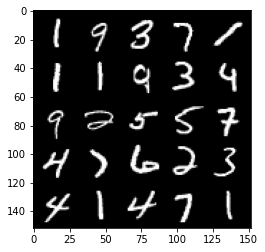

Step 68500: Generator loss: 1.5266349472999576, discriminator loss: 0.41819493997097007


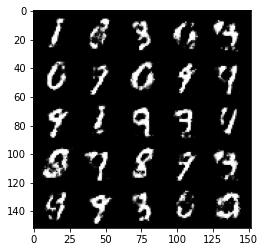

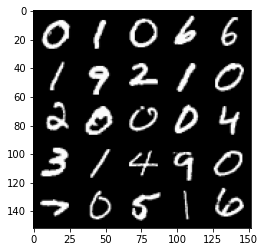

Step 69000: Generator loss: 1.510359672546388, discriminator loss: 0.40171323055028946


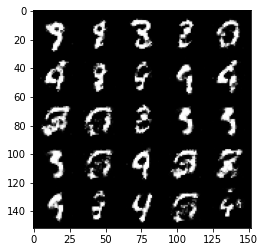

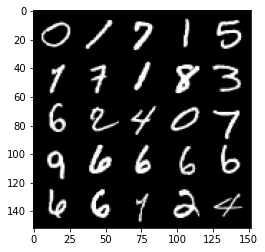

Step 69500: Generator loss: 1.5347352786064157, discriminator loss: 0.39513345348835005


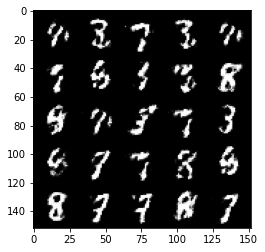

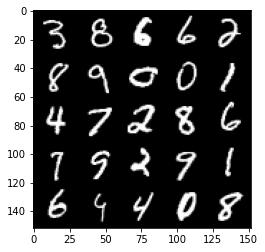

Step 70000: Generator loss: 1.6292762956619269, discriminator loss: 0.37255264014005646


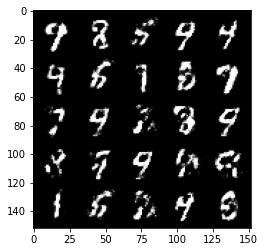

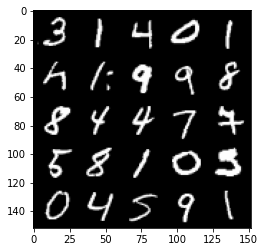

Step 70500: Generator loss: 1.4791401636600494, discriminator loss: 0.428574511170387


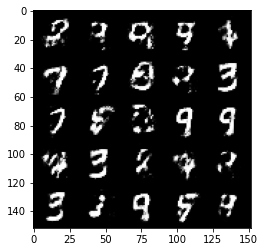

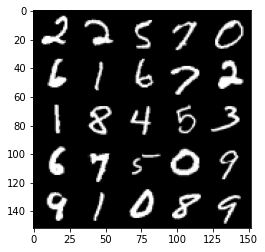

Step 71000: Generator loss: 1.483925957202909, discriminator loss: 0.4199687936902047


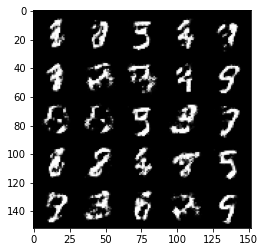

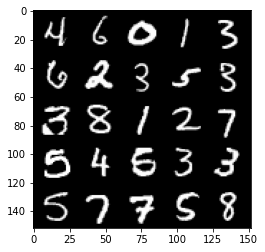

Step 71500: Generator loss: 1.539829534769057, discriminator loss: 0.40354050117731055


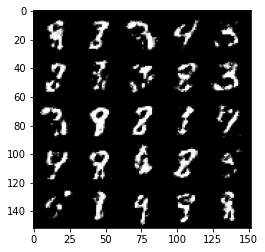

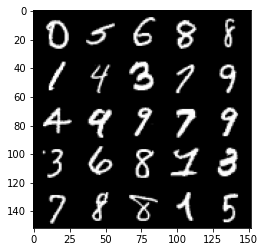

Step 72000: Generator loss: 1.5776176967620852, discriminator loss: 0.3884462141990659


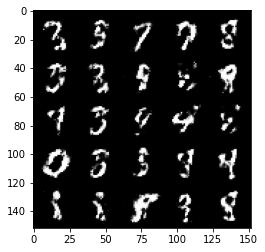

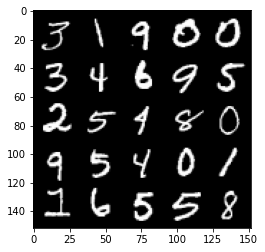

Step 72500: Generator loss: 1.482811014890669, discriminator loss: 0.40971856254339234


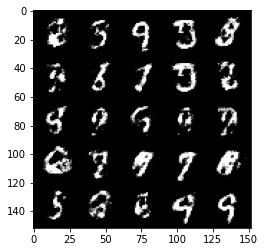

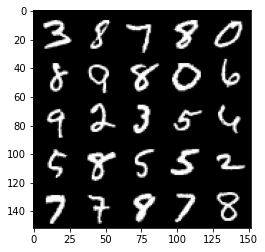

Step 73000: Generator loss: 1.514900686979292, discriminator loss: 0.41826740133762363


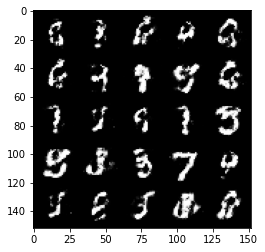

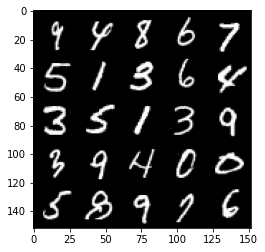

Step 73500: Generator loss: 1.464468077659606, discriminator loss: 0.40626506668329254


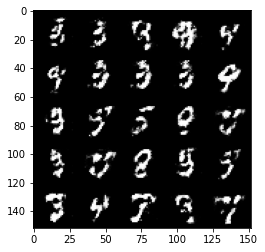

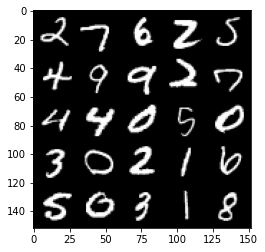

Step 74000: Generator loss: 1.513045300245285, discriminator loss: 0.40768606728315354


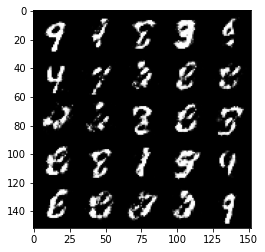

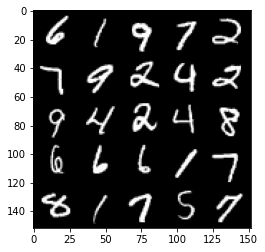

Step 74500: Generator loss: 1.4478049044609065, discriminator loss: 0.4224786378145215


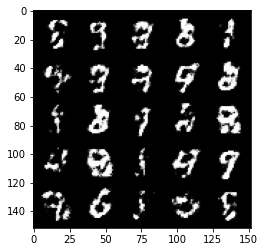

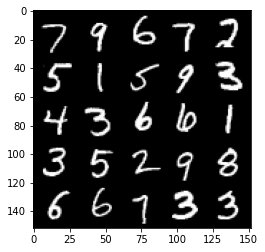

Step 75000: Generator loss: 1.4265728621482845, discriminator loss: 0.40989011472463566


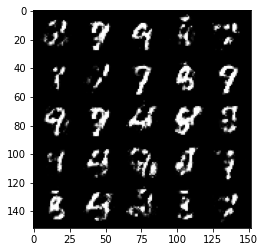

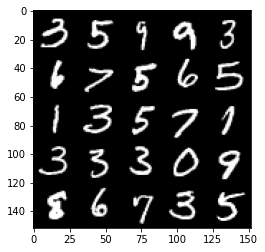

Step 75500: Generator loss: 1.4158536343574522, discriminator loss: 0.4347966878414151


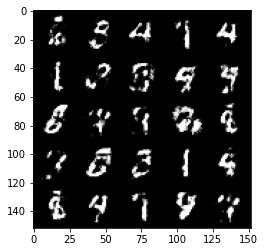

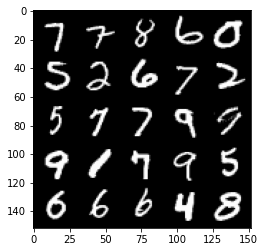

Step 76000: Generator loss: 1.368132532596589, discriminator loss: 0.44094496876001404


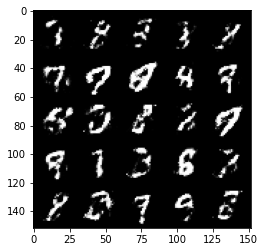

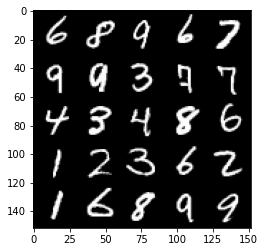

Step 76500: Generator loss: 1.4025220980644233, discriminator loss: 0.4468418626189233


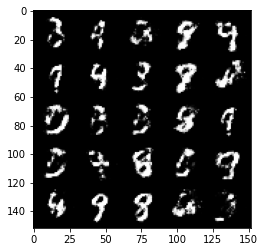

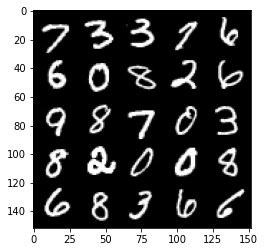

Step 77000: Generator loss: 1.3701408853530883, discriminator loss: 0.4395392061471934


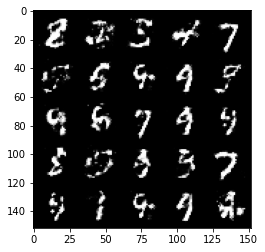

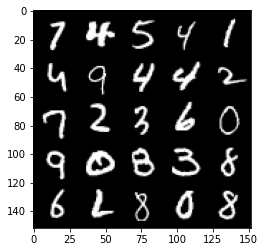

Step 77500: Generator loss: 1.281093801021576, discriminator loss: 0.4775713492035872


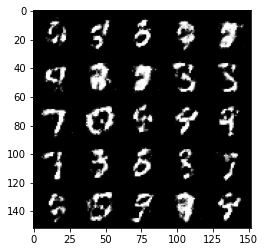

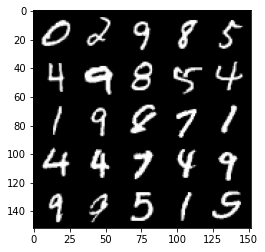

Step 78000: Generator loss: 1.297690709829331, discriminator loss: 0.45994650560617406


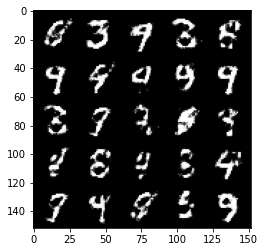

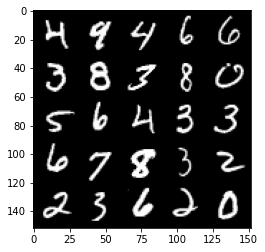

Step 78500: Generator loss: 1.3164297170639043, discriminator loss: 0.46089175856113457


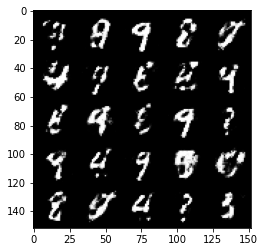

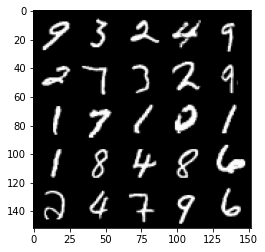

Step 79000: Generator loss: 1.3061854012012484, discriminator loss: 0.4607523351907725


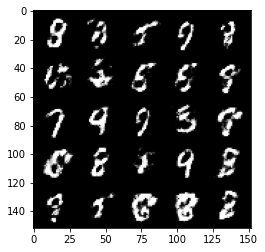

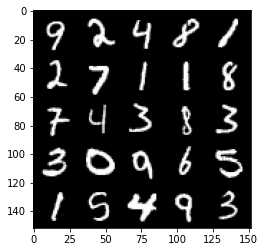

Step 79500: Generator loss: 1.3531662347316715, discriminator loss: 0.4499750708937644


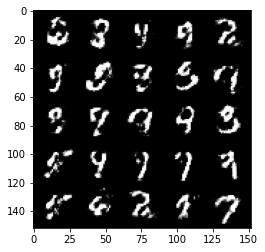

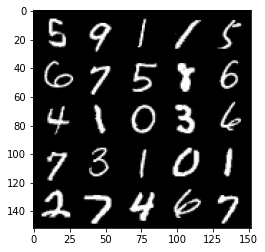

Step 80000: Generator loss: 1.3762609651088717, discriminator loss: 0.44384676319360733


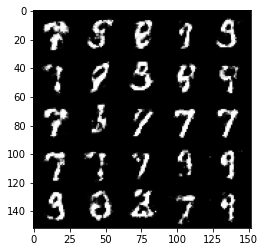

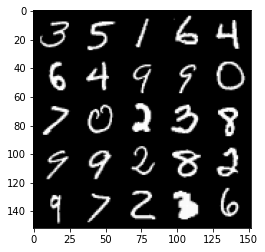

Step 80500: Generator loss: 1.3425872201919558, discriminator loss: 0.4555512148737907


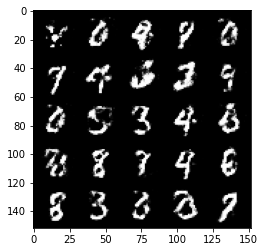

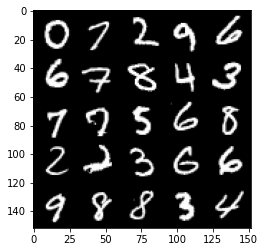

Step 81000: Generator loss: 1.3580758697986606, discriminator loss: 0.4450867941975597


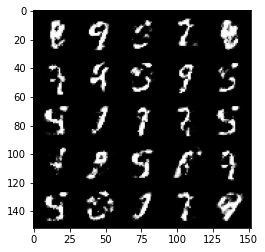

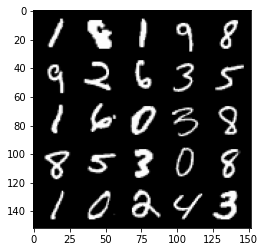

Step 81500: Generator loss: 1.346182349443436, discriminator loss: 0.4582175378799441


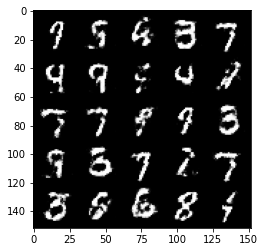

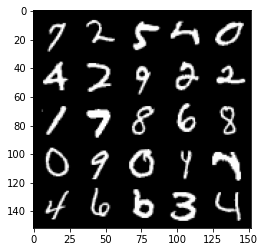

Step 82000: Generator loss: 1.293282792806626, discriminator loss: 0.4606419736742976


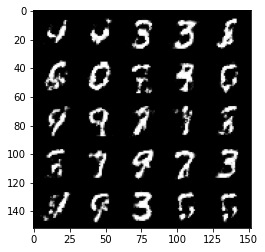

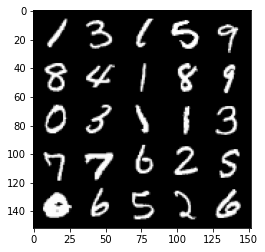

Step 82500: Generator loss: 1.3160352694988249, discriminator loss: 0.4601957268714907


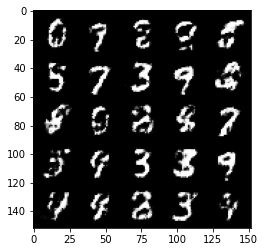

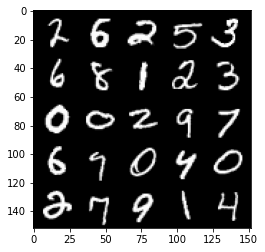

Step 83000: Generator loss: 1.3538168697357178, discriminator loss: 0.4444004141092302


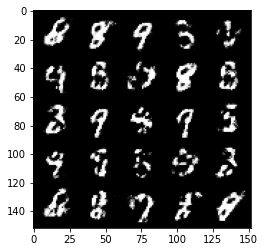

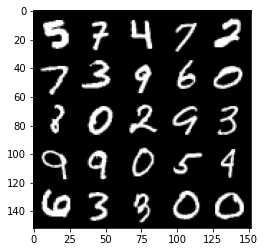

Step 83500: Generator loss: 1.4433616783618923, discriminator loss: 0.4249920350909232


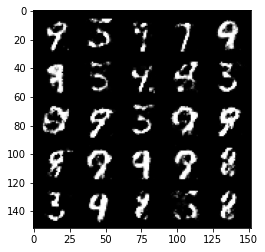

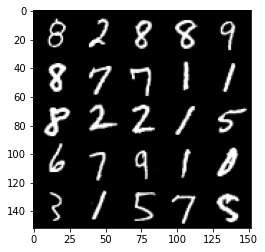

Step 84000: Generator loss: 1.3819897286891945, discriminator loss: 0.43971383821964266


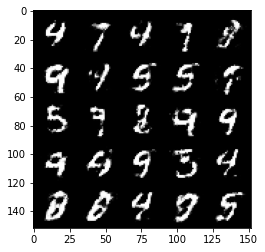

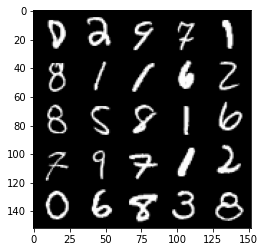

Step 84500: Generator loss: 1.3535400321483613, discriminator loss: 0.4472048164010048


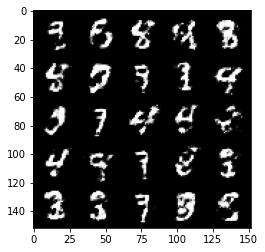

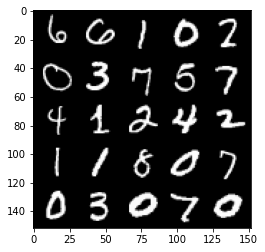

Step 85000: Generator loss: 1.3330171663761132, discriminator loss: 0.44379009789228474


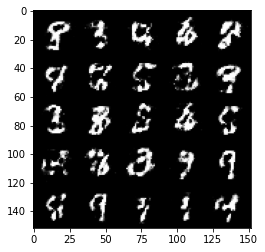

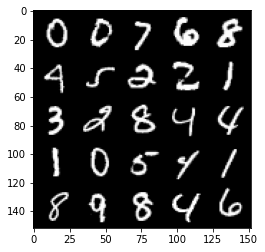

Step 85500: Generator loss: 1.3762438971996305, discriminator loss: 0.44025422525405844


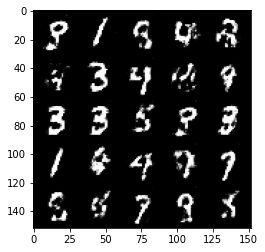

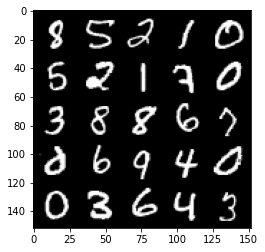

Step 86000: Generator loss: 1.3722214322090158, discriminator loss: 0.447433323025703


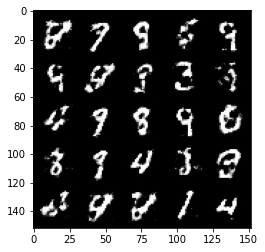

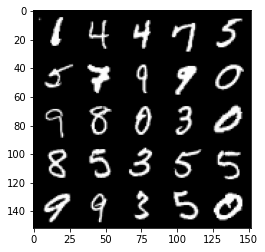

Step 86500: Generator loss: 1.336015917062759, discriminator loss: 0.47139113873243266


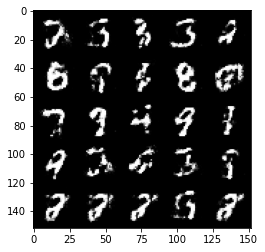

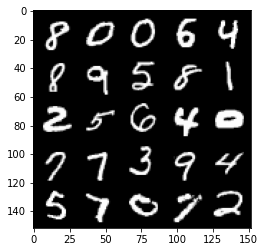

Step 87000: Generator loss: 1.2557221431732177, discriminator loss: 0.4758262078762049


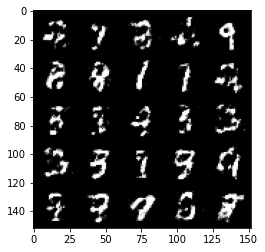

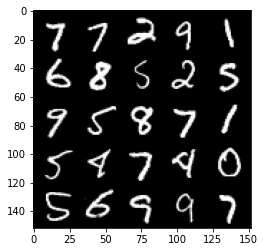

Step 87500: Generator loss: 1.265527856588365, discriminator loss: 0.46850800919532787


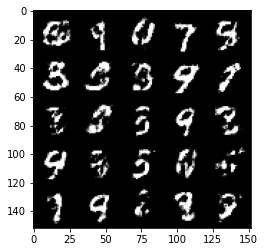

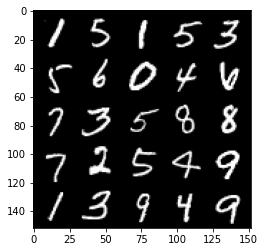

Step 88000: Generator loss: 1.3002982678413388, discriminator loss: 0.46456867635250093


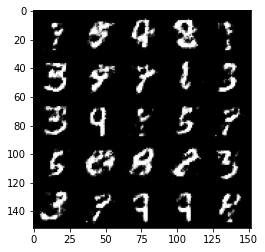

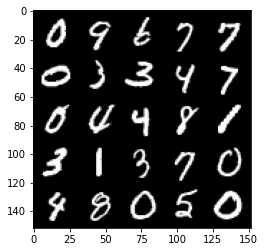

Step 88500: Generator loss: 1.2986477093696598, discriminator loss: 0.46122251695394495


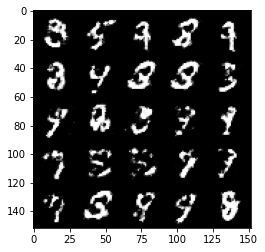

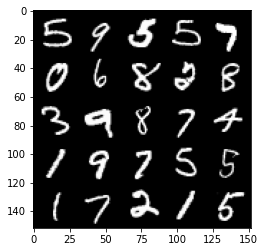

Step 89000: Generator loss: 1.2816563987731935, discriminator loss: 0.465231042742729


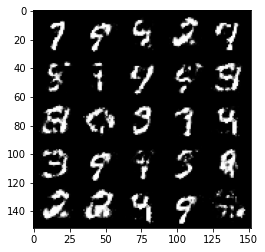

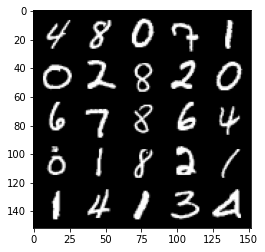

Step 89500: Generator loss: 1.29266720199585, discriminator loss: 0.4687899980545044


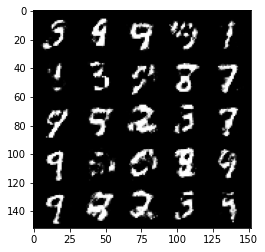

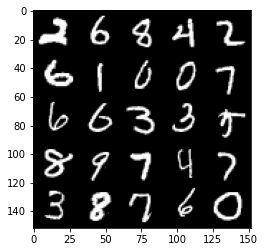

Step 90000: Generator loss: 1.2502022793292993, discriminator loss: 0.472201104938984


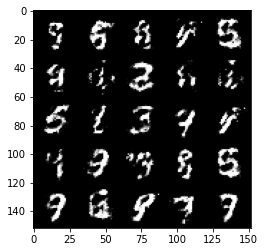

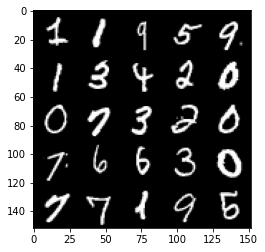

Step 90500: Generator loss: 1.3318915493488317, discriminator loss: 0.4564235227108002


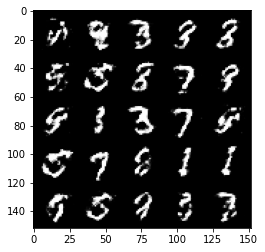

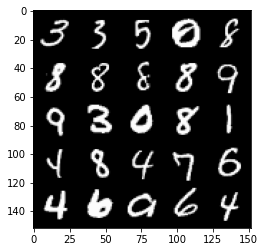

Step 91000: Generator loss: 1.159516278862954, discriminator loss: 0.5123574994206431


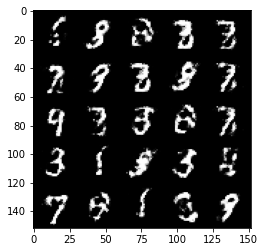

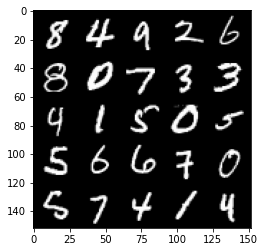

Step 91500: Generator loss: 1.248817802667618, discriminator loss: 0.4760661768913269


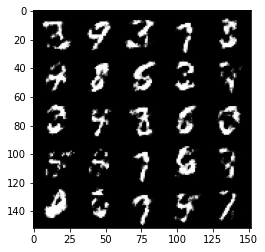

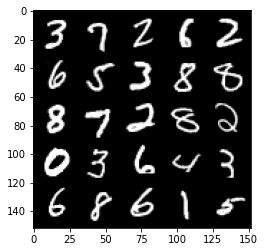

Step 92000: Generator loss: 1.1812559330463417, discriminator loss: 0.5045032968521121


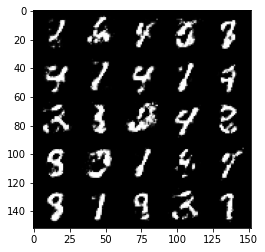

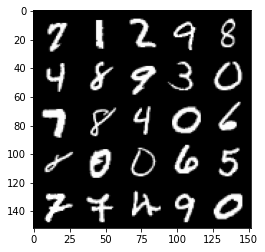

Step 92500: Generator loss: 1.279218744039536, discriminator loss: 0.46775674253702154


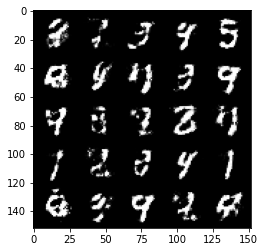

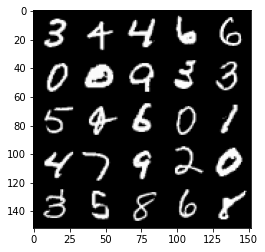

Step 93000: Generator loss: 1.2442408256530755, discriminator loss: 0.48493233942985525


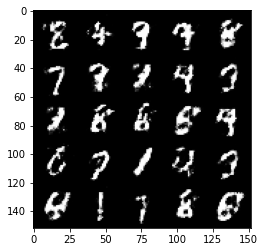

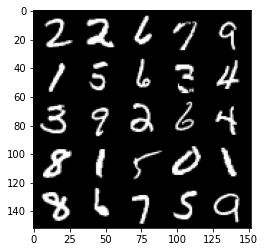

Step 93500: Generator loss: 1.29359502840042, discriminator loss: 0.46220653122663463


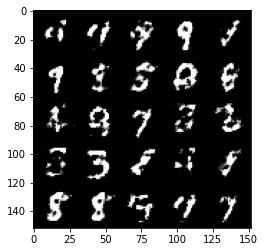

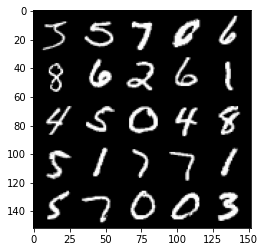

In [18]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
